In [2]:
%%capture
! pip install --upgrade pip
! pip install networkx
! pip install beautifulsoup4
! pip install python-louvain
! pip install fa2
! pip install wordcloud
! pip install yellowbrick

In [3]:
%%capture
from __future__ import division
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import requests
from bs4 import BeautifulSoup
import re
import string
import math
from time import time
from tqdm import tqdm
import nltk, re, pprint
from nltk.corpus import stopwords
from nltk import word_tokenize
import pickle 
import networkx as nx
import matplotlib.cm as cm
from fa2 import ForceAtlas2
from random import choice
from scipy import stats
import statistics
import community as community_louvain
from collections import Counter
from collections import defaultdict
import urllib
import os, os.path
import json
import itertools
from yellowbrick.text import DispersionPlot, dispersion
from yellowbrick.text.base import TextVisualizer
from yellowbrick.style.colors import resolve_colors
from yellowbrick.exceptions import YellowbrickValueError
nltk.download('punkt')
nltk.download('stopwords')

# Full UK Politics notebook
This is the merged notebook for the final rapport in Social Graphs

## Network Creation

### Creation of the small (unused) network:

We start by creating a small network, consisting of the elected MPs in 2019 as nodes (650 nodes), and then the edges are made when one politician link to another politician in the network through their personal Wiki page. 

We extend this network further later on, and this was not the final approach used in the report.

First, we extract the table from https://en.wikipedia.org/wiki/List_of_MPs_elected_in_the_2019_United_Kingdom_general_election and convert it into a dataframe.

In [ ]:
# get the response in the form of html
wikiurl="https://en.wikipedia.org/wiki/List_of_MPs_elected_in_the_2019_United_Kingdom_general_election"
table_class="wikitable sortable jquery-tablesorter"
response=requests.get(wikiurl)

# parse data from the html into a beautifulsoup object
soup = BeautifulSoup(response.text, 'html.parser')
elected_mps=soup.find('table',{'class':"wikitable", 'id':"elected-mps"})

# convert html table to dataframe
df=pd.read_html(str(elected_mps))
df=pd.DataFrame(df[0])
df=df[:-1]

Next, we extract the wiki-links to each elected MPs personal Wiki page.

In [ ]:
wikiurl = 'https://en.wikipedia.org/wiki/List_of_MPs_elected_in_the_2019_United_Kingdom_general_election'
soup = BeautifulSoup(requests.get(wikiurl).content, "html.parser")

pol_name_to_wikilink = {}
wikilink_to_pol_name = {}

for cell in soup.select("#elected-mps > tbody > tr > td:nth-of-type(4)"):
    if cell.select("p > b > a"): 
        tag = cell.select("p > b > a")[0]
    else:
        tag = cell.select("b > a")[0]  
    pol_name_to_wikilink[tag.text] = tag["href"].replace("/wiki/","")
    wikilink_to_pol_name[tag["href"].replace("/wiki/","")] = tag.text

We create a Python class for a politician, that includes all attributes we can extract from the Wiki table previously mentioned.

In [ ]:
from pandas import DataFrame
class Politician:
    def __init__(self, name, partyBeforeElection, partyAfterElection, constituency, notes):
        self.name = name
        self.wikilink = pol_name_to_wikilink[self.name]

        if "[" in partyBeforeElection: #Remove party name citation
            partyBeforeElection = partyBeforeElection[:-3]
        if "[" in partyAfterElection: #Remove party name citation
            partyAfterElection = partyAfterElection[:-3]

        self.partyBeforeElection = partyBeforeElection
        self.partyAfterElection = partyAfterElection
        self.constituency = constituency
        self.notes = notes
       
    def create_politicians_from_dataframe(df_tasks: DataFrame):
        politicians = {}
        for index, row in df_tasks.iterrows():
            politicians[row['Member returned']] = Politician(row['Member returned'], row['Party of incumbentbefore election.1'], row['Party of incumbentafter election.1'], row['Constituency'], row['Notes'])
        return politicians

Now, we are ready to create all the nodes of the network by extracting the MPs of the wiki table, and adding them as nodes with attributes:

In [ ]:
politicians = Politician.create_politicians_from_dataframe(df)

In [ ]:
politicians_graph = nx.DiGraph()
for name, pol in politicians.items():
    if not politicians_graph.has_node(name):
        politicians_graph.add_node(name)

    attr = {
        'wikilink' : pol.wikilink,
        'partyBeforeElection' : pol.partyBeforeElection,
        'partyAfterElection' : pol.partyAfterElection,
        'constituency' : pol.constituency,
        'notes' : pol.notes
    }
    nx.set_node_attributes(politicians_graph, {name: attr})    

Finally, we add the edges to the network by scraping the links of the politicians personal wiki-pages:

In [ ]:
wiki_text_link_pattern = r'(?:\[\[)([^|\]]*)(?:\||\]\])'

basewikiurl = "https://en.wikipedia.org/w/api.php?"
action = "action=parse"
content = "prop=wikitext"
dataformat ="format=json"
for name, pol in politicians.items():
    page_title = "page=" + pol.wikilink
    page_query = "{}{}&{}&{}&{}".format(basewikiurl, action, content, page_title, dataformat)
    page_response = urllib.request.urlopen(page_query)
    page_data = page_response.read()
    pol_json_load = json.loads(page_data.decode('utf-8'))
    pol_wikitext = {'*': ''}
    if 'parse' in pol_json_load:
        pol_wikitext = json.loads(page_data.decode('utf-8'))['parse']['wikitext']['*']
    formatted_pol_link_list = [link.replace(' ', '_') for link in re.findall(wiki_text_link_pattern, pol_wikitext)]
    
    for link in formatted_pol_link_list:
        if link in wikilink_to_pol_name:
            linked_pol_name = wikilink_to_pol_name[link]
            politicians_graph.add_edge(name,linked_pol_name)


pickle.dump( politicians_graph, open( "politicians_graph.pkl", "wb" ) )

In [5]:
print(politicians_graph.number_of_nodes(),'nodes')
print(politicians_graph.number_of_edges(),'edges')

650 nodes
4309 edges


### Creation of the bigger (this is used in the report) network:

we define methods that can be used for extracting the wiki data ids from a certain title and extracting claims (wiki meta data that can hold information about for example the profession of the person) from a wiki data id.

In [ ]:
basewikidataurl = "https://www.wikidata.org/w/api.php?"
wikidata_action = 'action=query'
wikidata_content = 'prop=pageprops'
claim_action = "action=wbgetclaims"

def get_wikidata_ids(page_title):
    wikidata_title = f'titles={page_title}'
    wikidata_query = "{}{}&{}&{}&{}&redirects=1".format(basewikiurl, wikidata_title, wikidata_content, wikidata_action, dataformat)
    wikidata_response = urllib.request.urlopen(wikidata_query)
    wikidata_data = wikidata_response.read()
    decoded = json.loads(wikidata_data.decode('utf-8'))
    try:
        page_list = decoded["query"]["pages"]
        #ids = [(page_name, page_props["pageprops"]["wikibase_item"]) for page_name, page_props in page_list]
        return next(iter(page_list.values()))["pageprops"]["wikibase_item"]
    except Exception as e:
        print(e, page_title, page_list)

def get_wikidata_claims(wikidata_id):
    claim_ids = f'entity={wikidata_id}'
    claim_page_query = "{}{}&{}&{}".format(basewikidataurl, claim_action, claim_ids, dataformat)
    claim_page_response = urllib.request.urlopen(claim_page_query)
    claim_page_data = claim_page_response.read()
    claim_data = json.loads(claim_page_data.decode('utf-8'))
    try:
        return flatten_claims(claim_data['claims'])
    except Exception as e:
        print(wikidata_id, claim_data)

Each party is associated with a wiki data id, which is the id that will appear in the claim of a person that belong to the respective party.

In [ ]:
party_id_names = {
    'Q9630': 'Labour Party',
    'Q215519': 'Democratic Unionist Party',
    'Q3243587': 'Scottish Conservatives',
    'Q10691': 'Plaid Cymru',
    'Q6467393': 'Labour Co-operative',
    'Q211931': 'Co-operative Party',
    'Q10647': 'UK Independence Party',
    'Q9626': 'Conservative Party',
    'Q106205438': 'Alba Party',
    'Q175443': 'Social Democratic and Labour Party',
    'Q9624': 'Liberal Democrats',
    'Q3499324': 'Green Party',
    'Q10658': 'Scottish National Party',
    'Q3250438': 'Scottish Liberal Democrats',
    'Q832685': 'Welsh Labour',
    'Q76382': 'Sinn Féin',
    'Q9669': 'Green Party of England and Wales',
}
party_wikidata_ids = list(party_id_names.keys())

By using the party claim ids, we can define methods that determine wether a certain person is a politician and if they are a uk politician.

In [ ]:
occupation_claim = 'P106'
political_party_claim = 'P102'
parliamentary_group_claim = 'P4100'

politician_occupation = 'Q82955'

def is_politician(claims):
    return occupation_claim in claims and politician_occupation in claims[occupation_claim]

def is_pol_in_uk(claims):
    result = []
    if political_party_claim in claims:
        result += set(party_wikidata_ids).intersection(claims[political_party_claim])
    if parliamentary_group_claim in claims:
        result += set(party_wikidata_ids).intersection(claims[parliamentary_group_claim])
    return next(iter(result), None)

A method is defined for helping us extract the information we need from a raw claim coming from wikipedia:

In [ ]:
def flatten_claims(claims):
    # We're looking to analyze some claims that are sometimes used as qualifiers to other
    # claims (like membership to a party being represented as a qualifier of an elected position claim instead of as a primary claim)
    # This we receive the claims response and collect all claim values corresponding to each property as a dictionary
    # Returns {propertyID1: [qualifierID1, qualifierID2],}
    flat_claims = {}
    for property_key, property_value in claims.items():
        if property_key not in flat_claims:
            flat_claims[property_key] = []
        for item in property_value:
            # Some properties don't correspond to an object, instead just having a literal value (like dates)
            # For our purposes we're not interested in these
            if isinstance(item['mainsnak']['datavalue']['value'], dict) and 'id' in item['mainsnak']['datavalue']['value']:
                flat_claims[property_key].append(item['mainsnak']['datavalue']['value']['id'])
            if 'qualifiers' in item:
                for qualifier_key, qualifier_values in item['qualifiers'].items():
                    if qualifier_key not in flat_claims:
                        flat_claims[qualifier_key] = []
                    for qualifier_value in qualifier_values:
                        if 'datavalue' not in qualifier_value:
                            continue
                        # Some properties don't correspond to an object, instead just having a literal value (like dates)
                        # For our purposes we're not interested in these
                        if isinstance(qualifier_value['datavalue']['value'], dict) and 'id' in qualifier_value['datavalue']['value']:
                            flat_claims[qualifier_key].append(qualifier_value['datavalue']['value']['id'])
    return flat_claims

Now we are finally ready to create the network. This network extend on the precious smaller network, by including all politicians these nodes link to. It adds and edge to them and adds them as a node in the network with the relevant attributes for party characterization:

In [ ]:
# RegEx expression that returns a usable wikipedia link based on the wikilink format [page title1|page_title2]
wiki_text_link_pattern = r'(?:\[\[)([^|\]]*)(?:\||\]\])'

We'll loop through every found politician and query wikipedia for their page.
We'll parse their wikitext for any links. If they correspond to a node already in the graph, an edge is added.
If the page is not in the graph already, we will query wikidata for its page ID and then the claims of that page, to assess if they are politicians and affiliated to one of the Parliament parties
If a page corresponds to a politician, a node for it will be added. If it's also affiliated with a UK party, this party will be set as an attribute and it'll be added to a list for further study.
Politicians not affiliated with any party will be marked as 'External Politicians' instead

Now we'll parse the pages of politicians affiliated with UK parties that were not part of the 2019 elected MPs.
We'll find wikipedia links in their wikipedia page and add edges if they correspond to another node in the graph

In [ ]:
basewikiurl = "https://en.wikipedia.org/w/api.php?"
action = "action=parse"
content = "prop=wikitext"
dataformat ="format=json"
uk_politicians = []

for name, pol in politicians.items():
    page_title = "page=" + pol.wikilink
    page_query = "{}{}&{}&{}&{}".format(basewikiurl, action, content, page_title, dataformat)
    page_response = urllib.request.urlopen(page_query)
    page_data = page_response.read()
    pol_json_load = json.loads(page_data.decode('utf-8'))
    pol_wikitext = {'*': ''}
    if 'parse' in pol_json_load:
        # Load the pages wikitext
        pol_wikitext = json.loads(page_data.decode('utf-8'))['parse']['wikitext']['*']
    #Parse the wikitext for wikipedia links
    formatted_pol_link_list = [link.replace(' ', '_') for link in re.findall(wiki_text_link_pattern, pol_wikitext)]
    for link_name in formatted_pol_link_list:
        # Page is already part of the graph, no need to analyze it further
        if link_name in politicians_graph.nodes:
        continue
        # Now we retrieve the wikidata object ID and its claims, to check if we should add it to the graph/the attributes of the added node
        try:
        wikidata_id = get_wikidata_ids(cleanLink(link_name))
        except:
        #In case illegal characters that are not parsed get through, the execution should not stop
        pass
        if not wikidata_id:
        continue
        claims = get_wikidata_claims(wikidata_id)
        if not claims:
        continue
        politician = is_politician(claims)
        british_party = is_pol_in_uk(claims)
        if politician:
        in_link_map = link_name in wikilink_to_pol_name
        if not in_link_map:
            wikilink_to_pol_name[link_name] = link_name
        if british_party:
            if link_name not in uk_politicians and not in_link_map: 
                uk_politicians.append(link_name)
            party_name = party_id_names[british_party]
            attr = {
                'wikilink': link_name,
                'partyBeforeElection': party_name,
                'partyAfterElection': party_name,
            }
            politicians_graph.add_node(link_name)
            nx.set_node_attributes(politicians_graph, {link_name: attr})    
        else:
            politicians_graph.add_node(link_name)
            attr = {
                'partyBeforeElection' : 'External Politician',
                'partyAfterElection' : 'External Politician',
                'constituency' : 'External Politician',
                'notes' : 'External Politician'
            }
            nx.set_node_attributes(politicians_graph, {link_name: attr})
    # Now we can add all the edges emerging from the 2019 elected MP list that point to politicians 
    for link in formatted_pol_link_list:
        if link in wikilink_to_pol_name or link in politicians_graph.nodes:
            linked_pol_name = wikilink_to_pol_name[link]
            politicians_graph.add_edge(name,linked_pol_name)    

Some nodes show up duplicated due to titles or descriptions. Here we identify them and remove them. To make sure we only remove duplicated nodes we check if the party for both nodes are the same e.g. Stephen Flynn (Scottish Politician)/Stephen Flynn or Glenys Kinnock/Glenys Kinnock, Baroness of Holyhead

In [ ]:
basewikiurl = "https://en.wikipedia.org/w/api.php?"
action = "action=parse"
content = "prop=wikitext"
dataformat ="format=json"
for name in uk_politicians:
    page_title = "page=" + name
    try:
    page_query = f"{basewikiurl}{action}&{content}&{page_title}&{dataformat}"
    page_response = urllib.request.urlopen(cleanLink(page_query))
    except:
    pass
    page_data = page_response.read()
    pol_json_load = json.loads(page_data.decode('utf-8'))
    pol_wikitext = {'*': ''}
    if 'parse' in pol_json_load:
        pol_wikitext = json.loads(page_data.decode('utf-8'))['parse']['wikitext']['*']
    formatted_pol_link_list = [link.replace(' ', '_') for link in re.findall(wiki_text_link_pattern, pol_wikitext)]
    for link_name in formatted_pol_link_list:
    for link in formatted_pol_link_list:
        if link in politicians_graph.nodes:
            politicians_graph.add_edge(name, wikilink_to_pol_name[link] if link in wikilink_to_pol_name else link)

Some parties showed up in our claims requests with multiple names. Here we join these instances into the correct parties

In [ ]:
comma_title_pattern = r'([^,]*)(?:,.*)'
parenthesis_desc_pattern = r'([^(]*)(?:[\s]*\([^)]*\))'
pAElection = nx.get_node_attributes(politicians_graph, 'partyAfterElection')
remove_titles_dict = {}
for pol_node in politicians_graph.nodes:
    a = re.match(parenthesis_desc_pattern, pol_node)
    if a:
        if a.group(1).strip() in politicians_graph.nodes:
            polNode = politicians_graph.nodes[a.group(1).strip()]
            if polNode['partyAfterElection'] == pAElection[pol_node]:
                remove_titles_dict[pol_node] = a.group(1).strip()
                continue
        remove_titles_dict[pol_node] = a.group(1).strip()
        continue
    b = re.match(comma_title_pattern, pol_node)
    if b:
        if b.group(1).strip() in politicians_graph.nodes:
            polNode = politicians_graph.nodes[b.group(1).strip()]
            if polNode['partyAfterElection'] == pAElection[pol_node]:
                remove_titles_dict[pol_node] = b.group(1).strip()
                continue
        remove_titles_dict[pol_node] = b.group(1).strip()

nx.relabel_nodes(politicians_graph, remove_titles_dict, copy=False)

As this code takes very long to execute, we pickled the network, which is to be used in the following code. The pkl files can be found on our github, on the following URLs:

Small network (not used in report):  https://github.com/NajaJean/UK-politics-social-graphs/blob/main/small_uk_politics_network_(not_used_in_report).pkl?raw=true 

Bigger network (this is used in the report): https://github.com/NajaJean/UK-politics-social-graphs/blob/main/uk_politics_network.pkl?raw=true

## Visualizing the Network

### Visualizing the small network (not used in the report)

In [4]:
# Here we load in the directed network from the generated pickle file and extract the GCC   
small_network_pickle_url = 'https://github.com/NajaJean/UK-politics-social-graphs/blob/main/small_uk_politics_network_(not_used_in_report).pkl?raw=true'
small_politicians_graph_directed = pickle.load(urllib.request.urlopen(small_network_pickle_url))
GCC = small_politicians_graph_directed.subgraph(max(nx.weakly_connected_components(small_politicians_graph_directed), key=len))
small_politicians_graph_undirected = GCC.to_undirected()

In [14]:
"""
    This function takes a politician graph and creates a color_map 
    where the nodes are colored according to the partyAfterElection attribute.
    The party colors correspond to the party colors from the wikipedia page of elected MPs.
"""

parties_and_corresponding_color = {
    'Labour' : '#E4023B',
    'Labour Co-operative' : '#E4023B',
    'Conservative' : '#0387DC',
    'Scottish National' : '#FDF38E',
    'Liberal Democrats' : '#FAA619',
    'DUP' : '#D46A4B',
    'Change UK' : '#222221',
    'Birkenhead Social Justice' : '#B2393E',
    'Green' : '#6AB024',
    'Independent' : '#DCDCDC',
    'Plaid Cymru' : '#005B54',
    'Sinn Féin' : '#316760',
    'Speaker' : '#FFFFFF',
    'Vacant' : '#FFFFFF',
    'Alliance' : '#F6CB2E',
    'SDLP' : '#2AA82B',
    'External Politician' : '#000000',
    'Scottish Conservatives' : '#0B377B',
    'Alba' : '#035EB8',
    'Co-operative' : '#3F1D70',
    'Welsh Labour' : '#FE5682',
    'UK Independence' : '#D5D500'
}

def color_map_calculation(graph):
    # Retrieve parties for all nodes based on partyAfterElection attribute
    parties = nx.get_node_attributes(graph, "partyAfterElection")
    
    color_map = []
    for node in graph:
        # Retrieve the party of the node and it's corresponding color
        party_of_node = parties[node]
        try:
            color_of_node = parties_and_corresponding_color[party_of_node]
            # Append node color to the color map
            color_map.append(color_of_node)
        except:
            print('could not find color of',node)
    return color_map

In [6]:
"""
    This function takes a graph and return a node size 
    list based on the nodes' degrees multiplied by the given scalar
"""
def fa2_node_size_calculation(graph,scalar):
    #Get degree distribution
    degrees = dict(graph.degree)
    #Calculate node sizes
    node_size=[v*scalar for v in degrees.values()]

    return node_size

In [7]:
# position calculations taken from the ForceAtlas2 github:
#   (https://github.com/bhargavchippada/forceatlas2) 

forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=2.0,
                        strongGravityMode=False,
                        gravity=1.0,

                        # Log
                        verbose=True)

100%|██████████| 2000/2000 [00:07<00:00, 272.86it/s]
BarnesHut Approximation  took  1.85  seconds
Repulsion forces  took  4.89  seconds
Gravitational forces  took  0.04  seconds
Attraction forces  took  0.08  seconds
AdjustSpeedAndApplyForces step  took  0.20  seconds


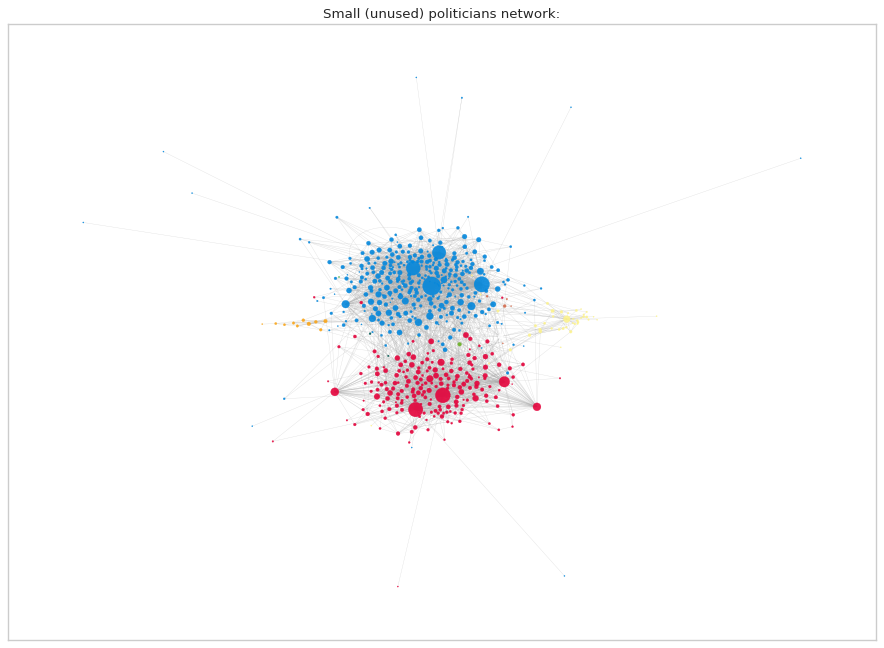

In [12]:
fig = plt.figure(figsize=(14, 10), dpi=80)

# Calculate forceatlas positions
pos = forceatlas2.forceatlas2_networkx_layout(small_politicians_graph_undirected, pos=None, iterations=2000)

# Draw nodes and edges
nx.draw_networkx_nodes(small_politicians_graph_undirected, pos, node_size=fa2_node_size_calculation(small_politicians_graph_undirected,1), alpha=0.9, node_color=color_map_calculation(small_politicians_graph_undirected))
nx.draw_networkx_edges(small_politicians_graph_undirected, pos, edge_color='darkgrey', alpha=0.4, width=0.3)

plt.title('Small (unused) politicians network:')
plt.grid(False)
plt.show()

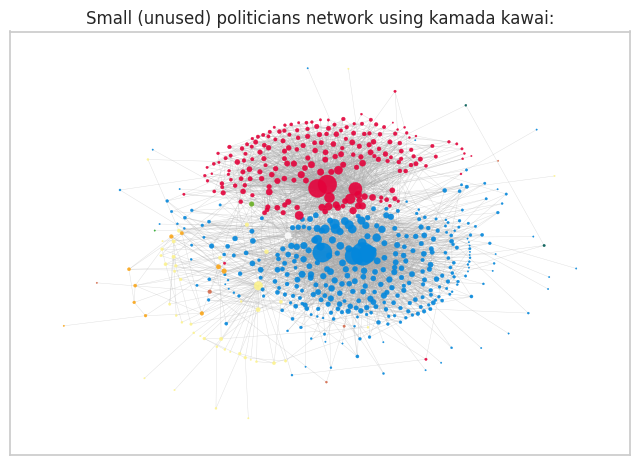

In [11]:
fig = plt.figure(1)

#Use kamada kawai layout compute position of nodes
pos = nx.kamada_kawai_layout(small_politicians_graph_undirected)

# Draw nodes and edges
nx.draw_networkx_nodes(small_politicians_graph_undirected, pos, node_size=fa2_node_size_calculation(small_politicians_graph_undirected,1), alpha=0.9, node_color=color_map_calculation(small_politicians_graph_undirected))
nx.draw_networkx_edges(small_politicians_graph_undirected, pos, edge_color='darkgrey', alpha=0.4, width=0.3)

plt.title('Small (unused) politicians network using kamada kawai:')
plt.grid(False)
plt.show()

### Visualizing the bigger network (this is used in the report)

In [15]:
# Here we load in the directed network from the generated pickle file and extract the GCC   
network_pickle_url = 'https://github.com/NajaJean/UK-politics-social-graphs/blob/main/uk_politics_network.pkl?raw=true'
politicians_graph_directed = pickle.load(urllib.request.urlopen(network_pickle_url))
GCC = politicians_graph_directed.subgraph(max(nx.weakly_connected_components(politicians_graph_directed), key=len))
bigger_politicians_graph_undirected = GCC.to_undirected()

In [18]:
# Calculate forceatlas positions and node colors
pos = forceatlas2.forceatlas2_networkx_layout(bigger_politicians_graph_undirected, pos=None, iterations=2000)
node_colors=color_map_calculation(bigger_politicians_graph_undirected)

fig = plt.figure(figsize=(14, 10), dpi=1200)

# Draw nodes and edges
nx.draw_networkx_nodes(bigger_politicians_graph_undirected, pos, node_size=fa2_node_size_calculation(bigger_politicians_graph_undirected,1), alpha=0.9, node_color=node_colors)
nx.draw_networkx_edges(bigger_politicians_graph_undirected, pos, edge_color='darkgrey', alpha=0.4, width=0.3)

plt.title('Politicians network:')
plt.grid(False)
plt.show();

100%|██████████| 2000/2000 [00:55<00:00, 35.83it/s]
BarnesHut Approximation  took  21.43  seconds
Repulsion forces  took  32.03  seconds
Gravitational forces  took  0.14  seconds
Attraction forces  took  0.37  seconds
AdjustSpeedAndApplyForces step  took  0.72  seconds


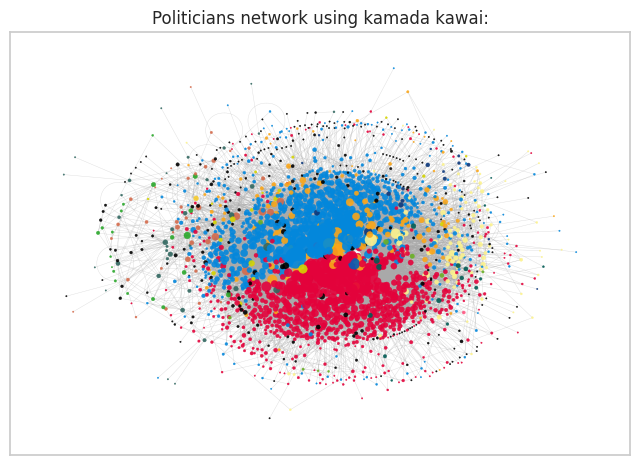

In [17]:
fig = plt.figure(1)

#Use kamada kawai layout compute position of nodes
pos = nx.kamada_kawai_layout(bigger_politicians_graph_undirected)

# Draw nodes and edges
nx.draw_networkx_nodes(bigger_politicians_graph_undirected, pos, node_size=fa2_node_size_calculation(bigger_politicians_graph_undirected,1), alpha=0.9, node_color=color_map_calculation(bigger_politicians_graph_undirected))
nx.draw_networkx_edges(bigger_politicians_graph_undirected, pos, edge_color='darkgrey', alpha=0.4, width=0.3)

plt.title('Politicians network using kamada kawai:')
plt.grid(False)
plt.show()

## Network Statistics

In [6]:
network_pickle_url = 'https://github.com/NajaJean/UK-politics-social-graphs/blob/main/uk_politics_network.pkl?raw=true'

# Here we load in the directed network from the generated pickle file
politicians_graph = pickle.load(urllib.request.urlopen(network_pickle_url))

In [7]:
numNodes = len(politicians_graph.nodes)
numLinks = len(politicians_graph.edges)

# Calculate statistics on ingoing degrees:
in_degrees = [in_degree for politician, in_degree in politicians_graph.in_degree]
avg_in_degrees = np.average(in_degrees)
median_in_degrees = round(np.median(in_degrees))
mode_in_degrees = statistics.mode(in_degrees)
min_in_degrees = min(in_degrees)
max_in_degrees = max(in_degrees)

# Calculate statistics on outgoing degrees:
out_degrees = [out_degree for politician, out_degree in politicians_graph.out_degree]
avg_out_degrees = np.average(out_degrees)
median_out_degrees = round(np.median(out_degrees))
mode_out_degrees = statistics.mode(out_degrees)
min_out_degrees = min(out_degrees)
max_out_degrees = max(out_degrees)

# Print results
print(f"The network has {numNodes} nodes and {numLinks} links.")
print(f"The in-degrees have an average of {avg_in_degrees:.2f}, a median of {median_in_degrees}, a mode of {mode_in_degrees}, a minimum of {min_in_degrees} and a maximum of {max_in_degrees}.")
print(f"The out-degrees have an average of {avg_out_degrees:.2f}, a median of {median_out_degrees}, a mode of {mode_out_degrees}, a minimum of {min_out_degrees} and a maximum of {max_out_degrees}.")

The network has 2287 nodes and 19494 links.
The in-degrees have an average of 8.52, a median of 4, a mode of 1, a minimum of 0 and a maximum of 396.
The out-degrees have an average of 8.52, a median of 6, a mode of 0, a minimum of 0 and a maximum of 118.


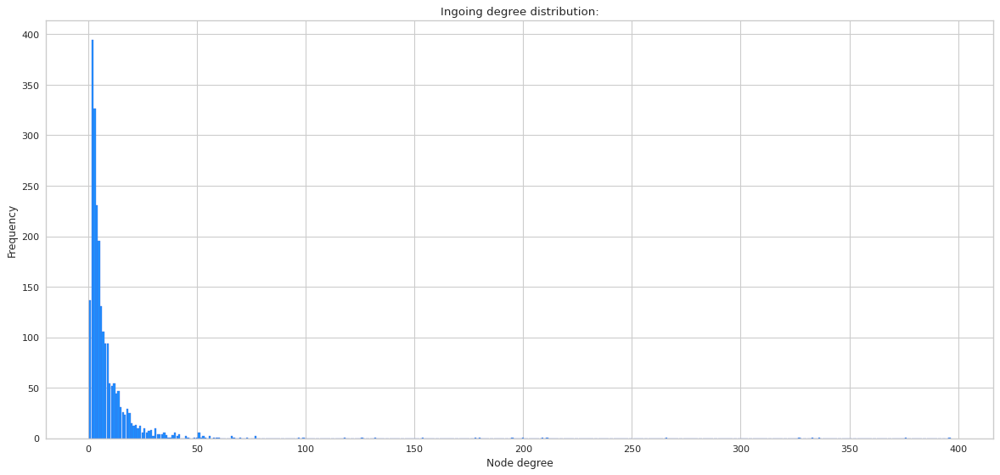

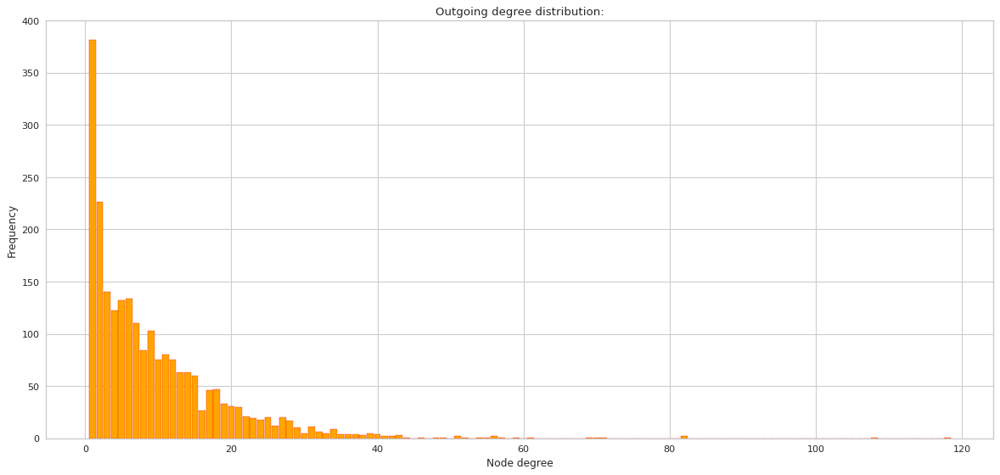

In [10]:
"""
    This function plots a histogram over the given data
"""
def plot_histogram(data, title, edgecolor, color):
    #Generate bins rounded to 2 digits for the x-ticks labels
    noOfBins = max(data)
    _, bins = np.histogram(data, noOfBins)
    plt.figure(figsize=(18, 8), dpi=80)
    counts, edges, bars = plt.hist(data, bins=noOfBins, edgecolor=edgecolor, color=color, rwidth=0.9, align='right');
    plt.xlabel("Node degree")
    plt.ylabel("Frequency")
    plt.title(title)
    plt.show()

# Plot in- and outgoing degree distributions
plot_histogram(in_degrees,"Ingoing degree distribution:",'royalblue','dodgerblue')
plot_histogram(out_degrees,"Outgoing degree distribution:",'red','orange')

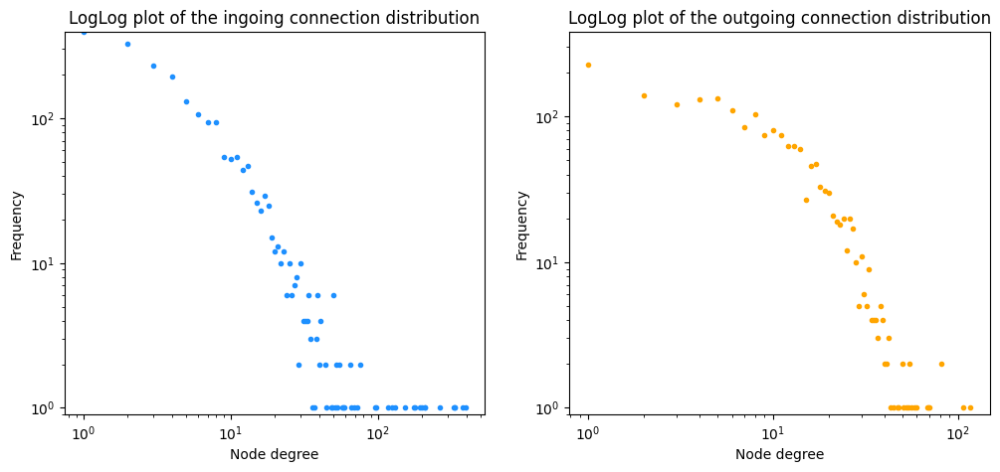

In [ ]:
_, axs = plt.subplots(1, 2, figsize=(12, 5))

def plotLogLog(degrees, max_degrees, pos, title, color):
    degree_histogram, _ = np.histogram(degrees, bins=range(max_degrees+1))

    axs[pos].loglog([x for x in degree_histogram], linewidth=0, marker='.', color=color)
    axs[pos].set_xlabel("Node degree")
    axs[pos].set_ylabel("Frequency")
    axs[pos].set_title(title)
    axs[pos].set_ylim(0.9, max(degree_histogram))

plotLogLog(in_degrees, max_in_degrees, 0, 'LogLog plot of the ingoing connection distribution', 'dodgerblue')
plotLogLog(out_degrees, max_out_degrees, 1, 'LogLog plot of the outgoing connection distribution','orange')
plt.show()

### Define functions for printing stats:

In [26]:
# Print highest in-degrees:
"""
    Print the nodes with the top 15 highest in-degrees 
    We print in-degree, name and party
"""
def top15InDegs(g):
    sortedNodesAfterInDegree = sorted(g.in_degree, key=lambda x: x[1], reverse=True)
    node_dict = dict(g.nodes())

    print('Top 15 highest in-degrees:')
    print()
    for i in range(15):
        name = sortedNodesAfterInDegree[i][0]
        degree = sortedNodesAfterInDegree[i][1]
        party = node_dict[name]['partyAfterElection']

        print(str(degree) + ', ' + name + ', ' + party)

In [27]:
# party distribution for the top 3 in-degree nodes.
"""
    Print the percentage from each party in the indegrees 
    for the top 3 in-degree nodes.
"""
def printPartyDistributionForTop3Ingoing(g):
    sortedNodesAfterInDegree = sorted(g.in_degree, key=lambda x: x[1], reverse=True)
    node_dict = dict(g.nodes())

    for i in range(3):
        pol_name = sortedNodesAfterInDegree[i][0]

        ingoingPoliticians = [x[0] for x in g.in_edges(nbunch=pol_name)]
        ingoingParties = [node_dict[name]['partyAfterElection'] for name in ingoingPoliticians]

        print('Distribution of parties in the ingoing edges of '+pol_name)

        for party, count in Counter(ingoingParties).most_common():
            part = (count/len(ingoingPoliticians))*100
            print(party + ': '+str(round(part, 2))+'%')
        
        print()

In [28]:
# Print highest out-degrees:
"""
    Print the nodes with the top 15 highest out-degrees 
    We print out-degree, name and party
"""
def top15OutDegs(g):
    sortedNodesAfterOutDegree = sorted(g.out_degree, key=lambda x: x[1], reverse=True)
    node_dict = dict(g.nodes())

    print('Top 15 highest out-degrees:')
    print()
    for i in range(15):
        name = sortedNodesAfterOutDegree[i][0]
        degree = sortedNodesAfterOutDegree[i][1]
        party = node_dict[name]['partyAfterElection']

        print(str(degree) + ', ' + name + ', ' + party)

In [29]:
# party distribution for the top 3 out-degree nodes.
"""
    Print the percentage from each party in the outdegrees 
    for the top 3 out-degree nodes.
"""
def printPartyDistributionForTop3Outgoing(g):
    sortedNodesAfterOutDegree = sorted(g.out_degree, key=lambda x: x[1], reverse=True)
    node_dict = dict(g.nodes())

    for i in range(3):
        pol_name = sortedNodesAfterOutDegree[i][0]

        outgoingPoliticians = [x[1] for x in g.out_edges(nbunch=pol_name)]
        outgoingParties = [node_dict[name]['partyAfterElection'] for name in outgoingPoliticians]
       
        print('Distribution of parties in the outgoing edges of '+pol_name)

        for party, count in Counter(outgoingParties).most_common():
            part = (count/len(outgoingPoliticians))*100
            print(party + ': '+str(round(part, 2))+'%')
        
        print()

In [30]:
# highest diff between in and outgoing degree
"""
    Prints the two names of the nodes in a graph g with the highest difference in ingoing vs outgoing degrees
"""
def highestDiffBetweenInAndOut(g):

    degreeSeqIn = np.array(list(dict(g.in_degree()).values()))
    degreeSeqOut = np.array(list(dict(g.out_degree()).values()))

    subtractedOutIn = list(np.subtract(degreeSeqOut, degreeSeqIn))
    subtractedInOut = list(np.subtract(degreeSeqIn, degreeSeqOut))

    max_index_OutIn = subtractedOutIn.index(max(subtractedOutIn))
    max_index_InOut = subtractedInOut.index(max(subtractedInOut))

    name_OutIn = list(g.nodes())[max_index_OutIn]
    name_InOut = list(g.nodes())[max_index_InOut]
    
    print("Maximum node with delta=outgoing-ingoing:",name_OutIn)
    print()
    print("Maximum node with delta=ingoing-outgoing:",name_InOut)

### Statistics performed on the smaller network (this was not used):

In [40]:
small_network_pickle_url = 'https://github.com/NajaJean/UK-politics-social-graphs/blob/main/small_uk_politics_network_(not_used_in_report).pkl?raw=true'
small_politicians_graph = pickle.load(urllib.request.urlopen(small_network_pickle_url))

In [41]:
top15InDegs(small_politicians_graph)

Top 15 highest in-degrees:

265, Boris Johnson, Conservative
187, Theresa May, Conservative
176, Jeremy Corbyn, Labour
164, Keir Starmer, Labour
160, Liz Truss, Conservative
147, Rishi Sunak, Conservative
87, Ed Miliband, Labour
47, Harriet Harman, Labour
44, Angela Rayner, Labour
41, Michael Gove, Conservative
36, Sajid Javid, Conservative
35, Iain Duncan Smith, Conservative
35, Ian Blackford, Scottish National
32, Dominic Raab, Conservative
30, Lisa Nandy, Labour


In [42]:
printPartyDistributionForTop3Ingoing(small_politicians_graph)

Distribution of parties in the ingoing edges of Boris Johnson
Conservative: 89.43%
Labour: 7.92%
Scottish National: 1.51%
Speaker: 0.38%
Labour Co-operative: 0.38%
DUP: 0.38%

Distribution of parties in the ingoing edges of Theresa May
Conservative: 90.91%
Labour: 5.35%
Scottish National: 2.14%
Liberal Democrats: 1.07%
Labour Co-operative: 0.53%

Distribution of parties in the ingoing edges of Jeremy Corbyn
Labour: 79.55%
Labour Co-operative: 10.23%
Conservative: 9.09%
Green: 0.57%
Scottish National: 0.57%



In [43]:
top15OutDegs(small_politicians_graph)

Top 15 highest out-degrees:

43, Jeremy Corbyn, Labour
38, Keir Starmer, Labour
36, Boris Johnson, Conservative
28, Jacob Rees-Mogg, Conservative
26, Theresa May, Conservative
24, Dominic Raab, Conservative
23, Angela Rayner, Labour
23, Sajid Javid, Conservative
23, Michael Gove, Conservative
22, Rishi Sunak, Conservative
21, Anne-Marie Trevelyan, Conservative
21, Alex Burghart, Conservative
21, Ed Miliband, Labour
21, Nadhim Zahawi, Conservative
20, Emily Thornberry, Labour


In [44]:
printPartyDistributionForTop3Outgoing(small_politicians_graph)

Distribution of parties in the outgoing edges of Jeremy Corbyn
Labour: 86.05%
Conservative: 9.3%
Labour Co-operative: 4.65%

Distribution of parties in the outgoing edges of Keir Starmer
Labour: 76.32%
Conservative: 13.16%
Labour Co-operative: 7.89%
Speaker: 2.63%

Distribution of parties in the outgoing edges of Boris Johnson
Conservative: 80.56%
Labour: 13.89%
Speaker: 2.78%
Labour Co-operative: 2.78%



In [45]:
highestDiffBetweenInAndOut(small_politicians_graph)

Maximum node with delta=outgoing-ingoing: Neil O'Brien

Maximum node with delta=ingoing-outgoing: Boris Johnson


### Statistics performed on the bigger network (the network we generally decided to work with):

In [46]:
network_pickle_url = 'https://github.com/NajaJean/UK-politics-social-graphs/blob/main/uk_politics_network.pkl?raw=true'

# Here we load in the directed network from the generated pickle file
bigger_politicians_graph = pickle.load(urllib.request.urlopen(network_pickle_url))

In [47]:
top15InDegs(bigger_politicians_graph)

Top 15 highest in-degrees:

396, Boris Johnson, Conservative
375, David Cameron, Conservative
335, Jeremy Corbyn, Labour
332, Tony Blair, Labour
326, Theresa May, Conservative
265, Gordon Brown, Labour
210, Margaret Thatcher, Conservative
208, Ed Miliband, Labour
199, Keir Starmer, Labour
194, Liz Truss, Conservative
179, John Major, Conservative
177, Rishi Sunak, Conservative
153, Owen Smith, Labour
131, William Hague, Conservative
125, Harriet Harman, Labour


In [ ]:
printPartyDistributionForTop3Ingoing(bigger_politicians_graph)

Distribution of parties in the ingoing edges of Boris Johnson
Conservative: 80.3%
Labour: 12.12%
Liberal Democrats: 2.78%
Scottish Conservatives: 1.77%
Scottish National: 1.26%
DUP: 0.76%
Speaker: 0.25%
Labour Co-operative: 0.25%
Plaid Cymru: 0.25%
UK Independence: 0.25%

Distribution of parties in the ingoing edges of David Cameron
Conservative: 69.33%
Labour: 17.33%
Liberal Democrats: 9.87%
UK Independence: 1.33%
Scottish Conservatives: 0.53%
Scottish National: 0.53%
Labour Co-operative: 0.27%
Plaid Cymru: 0.27%
Green: 0.27%
Alba: 0.27%

Distribution of parties in the ingoing edges of Jeremy Corbyn
Labour: 82.69%
Conservative: 8.36%
Labour Co-operative: 6.27%
Liberal Democrats: 1.19%
UK Independence: 0.6%
Green: 0.3%
Scottish National: 0.3%
Plaid Cymru: 0.3%



In [ ]:
top15OutDegs(bigger_politicians_graph)

Top 15 highest out-degrees:

118, Jeremy Corbyn, Labour
107, Boris Johnson, Conservative
81, Theresa May, Conservative
81, David Cameron, Conservative
70, Michael Heseltine, Conservative
69, Ed Miliband, Labour
68, Chris Williamson, Labour
60, Keir Starmer, Labour
58, Jacob Rees-Mogg, Conservative
56, Harriet Harman, Labour
55, Sajid Javid, Conservative
55, Michael Gove, Conservative
54, Hilary Benn, Labour
53, Tony Blair, Labour
51, Kenneth Clarke, Conservative


In [ ]:
printPartyDistributionForTop3Outgoing(bigger_politicians_graph)

Distribution of parties in the outgoing edges of Jeremy Corbyn
Labour: 62.71%
External Politician: 22.03%
Conservative: 9.32%
Liberal Democrats: 2.54%
Labour Co-operative: 1.69%
Sinn Féin: 0.85%
UK Independence: 0.85%

Distribution of parties in the outgoing edges of Boris Johnson
Conservative: 58.88%
External Politician: 25.23%
Labour: 8.41%
Liberal Democrats: 3.74%
Labour Co-operative: 1.87%
Speaker: 0.93%
UK Independence: 0.93%

Distribution of parties in the outgoing edges of Theresa May
Conservative: 58.02%
Labour: 18.52%
External Politician: 13.58%
Liberal Democrats: 4.94%
Labour Co-operative: 1.23%
DUP: 1.23%
UK Independence: 1.23%
Scottish National: 1.23%



In [ ]:
highestDiffBetweenInAndOut(bigger_politicians_graph)

Maximum node with delta=outgoing-ingoing: Chris Williamson

Maximum node with delta=ingoing-outgoing: David Cameron


## Speech Scraping

The following code scrapes the UK pol speech archive (https://www.ukpol.co.uk/speeches/c/) and saves the content in a csv file called speeches_ukpol.csv.

In [ ]:
%%capture
def get_ukpol_speech(url, lastname_first_letter=None):
    # Get the html and soup it
    try:
        r = requests.get(url)
    except:
        print(f'Failed to parse: {url}')
        return
    # Obtain the division of the page with the speech
    soup = BeautifulSoup(r.text,"lxml")
    div = soup.find(name='div', attrs={'class': 'entry-content'})
    if div == None:
        print(f'No soup found. Check url: {url}')
        return
    speech_div = div.find_all(name='p')

    
    # find the desription of the speech
    desc_index=-1
    for j in range(len(speech_div)):
        if speech_div[j].em:
            desc_index = j
            break
    if desc_index==-1:
        print(f'Description not found for {url}.')
        return
    speech_description = str(speech_div[desc_index].string)
    
    # extract the speech as one long string.
    speech = ''   
    faulty_encoding_samples = {'â\x80\x9c':'"', 'â\x80\x9d':'"', 'â\x80\x94':' ', 'â\x80\x99':"'", '\xa0':'', '\x80\x94':'', '\xe2\x80\x99':"'", '\xe2\x80\x93':'-'}
    for i in range(desc_index+1,len(speech_div)): 
        speech += ' '
        next_sentence = str(speech_div[i].string)
        for fault in faulty_encoding_samples.keys():
            next_sentence = next_sentence.replace(fault, faulty_encoding_samples[fault])
        if re.match(r'\s+\[insert_php\]', next_sentence):
            next_sentence = ''
        speech += next_sentence


    if re.search('\Wx', speech):
        print(f'Possible encoding error found in {url}')
        
    # find the tags
    tag_soup = soup.find(name='span', attrs={'class':'tag-links'})
#     tags = []
    candidate_year=None
    candidate_speaker=None
    try:
        for a in tag_soup.find_all('a'):
            text = a.get_text()
    #         tags.append(text)
            if text.isdigit():
                candidate_year = int(text)
            elif candidate_speaker != None:
                if not lastname_first_letter in [x[0].lower() for x in candidate_speaker.split()]:
                    candidate_speaker = text
            elif candidate_speaker == None:
                if not text in ['Nelson Mandela','Sinn Fein','Taxation','Corbyn Suspended','Speeches', 'Comments', 'Constituency', 'Department for Education', 'Foreign and Commonwealth Office', 'Press Release', 'Foreign Office', 'HM Queen Elizabeth II', 'Maiden Speech', 'President of Ukraine', 'Press Release']:
                    candidate_speaker = text
    except AttributeError:
        print(f'No tags found for {url}')
    return (candidate_year, candidate_speaker, speech_description, speech.strip())

In [ ]:
%%capture
def fetch_ukpol_speeches(start_index = 0, letters_to_do = 26):
    # Find the URLs and grab the speeches
    descriptions = []
    speeches = []
    years = []
    speakers = []
    alphabet = list(string.ascii_lowercase)
    for a in alphabet[start_index: start_index + letters_to_do]:
        t0=time()
        if a == 'c':
            url_a = 'https://www.ukpol.co.uk/speeches/c/'
        else:
            url_a = f'https://www.ukpol.co.uk/speeches/speeches-{a}/'
        try:
            r = requests.get(url_a)
        except:
            print(f'Failed to parse: {url_a}')
            break
        soup = BeautifulSoup(r.text,"lxml")
        div = soup.find(name='div', attrs={'class': 'entry-content'})
        div = div.find_all(name='a', href=True)
        print(f'There are {len(div)} speeches for letter {a}.')
        for i in tqdm(range(len(div))):
            new_url = div[i]['href']
            x = get_ukpol_speech(new_url, lastname_first_letter=a)
            if not x == None:
                year, speaker, desc, speech = x 
            descriptions.append(desc)
            speeches.append(speech)
            years.append(year)
            speakers.append(speaker)
        print(f'Done all from letter {a} in {time()-t0:.2f} seconds.')
    return pd.DataFrame({"Speaker":speakers, "Year":years, "Description":descriptions,"Speech":speeches})

In [ ]:
speech_df = fetch_ukpol_speeches(start_index = 0, letters_to_do = 26)
speech_df.to_csv('speeches_ukpol.csv')

## Text Analysis

**Overview of created dictionaries:**

**poly**
key: name of speaker (string)
value: speech (string)
ex: poly['Diane Abbott'] = 'None The fact that the House of Commons has spent the whole'

**text_dict**
key: name of speaker (string)
value: speech (nltk.text)
ex: text_dict['Diane Abbott'] =  <\Text: none the fact that the house of commons...

**parties_dict**
key: party (string)
value: array of party members, polititians (string array)
ex: parties_dict['Plaid Cymru'] = ['Jonathan Edwards', 'Ben Lake',..]

**TF**
key: party (string)
value: Counter({word: count}) (Counter)
ex: TF['Alliance'] = Counter({'this': 59, 'is': 132, 'an': 22, ..})

**Upload and clean up data**

In [5]:
ukpol = pd.read_csv('speeches_ukpol.csv')

In [6]:
# Clean the dataset
ukpol['Year'] = ukpol['Year'].fillna(0)
ukpol['Year'] = ukpol['Year'].astype(int)
ukpol = ukpol.dropna(subset=['Speaker'])
ukpol = ukpol.dropna(subset=['Speech'])
ukpol = ukpol.drop(columns=['Unnamed: 0'])
ukpol = ukpol.reset_index(drop=True)

**Speech distribution pr. year**

13.748203263718617

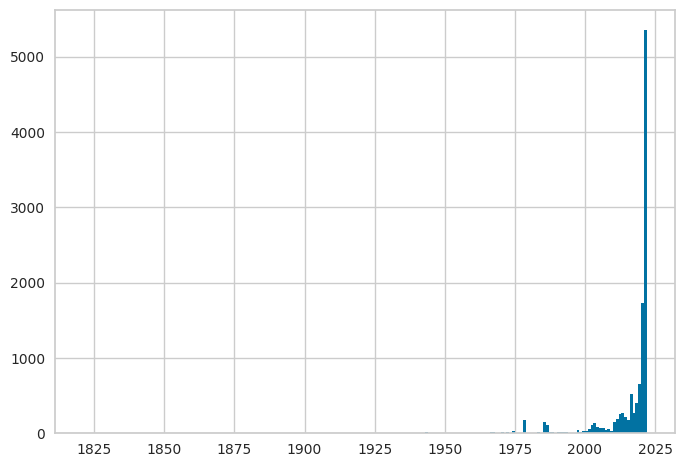

In [8]:
hist = plt.hist(ukpol['Year'], bins=int(2022-1821), range=(1821,2022))
speech_percantage = [c/np.sum(hist[0]) for c in hist[0]]

# Percentage of speeches before 2011
(1-np.sum(speech_percantage[-12:]))*100

**Create dictionaries:**

In [ ]:
# Make a dictionary with every politician and their concatenated speeches
poly = {}
for i in range(len(ukpol.Speaker)):
    current_p = ukpol.Speaker[i]
    try:
        poly[current_p] = poly[current_p] + ukpol.Speech[i]
    except:
        poly[current_p] = ukpol.Speech[i]

print(´'There are', len(poly), 'politicans')

1776


In [ ]:
# Create a corpus called text_dict, which contains all the political speeches formatted into nltk.Text 
# The key is the name of the politician and the value is their speeches
# This is done, such that we can use nltk's functions on the texts
text_dict = {}
for i in poly:
    no_punct = re.sub(r'[^\w\s]', '', poly[i])
    no_punct = re.sub(r'\n', ' ', no_punct)
    no_punct = no_punct.lower()
    tokens = word_tokenize(no_punct)
    text_dict[i] = nltk.Text(tokens)

**Loading in network and pairing nodes and speeches**

In [27]:
network_pickle_url = 'https://github.com/NajaJean/UK-politics-social-graphs/blob/main/uk_politics_network.pkl?raw=true'

# Here we load in the directed network from the generated pickle file
bigger_politicians_graph = pickle.load(urllib.request.urlopen(network_pickle_url))

In [28]:
# Function adding speeches to the network
def add_speech_to_graph(graph):
    nx.set_node_attributes(graph, " ", "speech_text")
    number_of_updated = 0

    for node in graph.nodes:
        try:
            s = text_dict[node]
            graph.nodes[node]['speech_text'] = s
            number_of_updated += 1

        except:
            continue

    print(number_of_updated, 'nodes were updated with speech text')
    return graph

network_with_speeches = add_speech_to_graph(bigger_politicians_graph)

1060 nodes were updated with speech text


**Seperating into parties**

In [29]:
# Find all parties and make them into a list
parties = {}
tmp_parties = []
for (p, d) in network_with_speeches.nodes(data=True):
    tmp_parties.append(d['partyAfterElection'])
parties = set(tmp_parties)
parties = list(parties)
print('List of all british parties:')
parties

List of all british parties:


['SDLP',
 'Liberal Democrats',
 'Labour Co-operative',
 'Welsh Labour',
 'DUP',
 'Labour',
 'Green',
 'External Politician',
 'UK Independence',
 'Plaid Cymru',
 'Speaker',
 'Alliance',
 'Conservative',
 'Scottish Conservatives',
 'Sinn Féin',
 'Alba',
 'Scottish National']

In [30]:
# Creating a corpus containing the party as key and their members (in node format) as value
parties_dict = {}
for k in parties:
    parties_dict[k] = [x for x,y in network_with_speeches.nodes(data=True) if y['partyAfterElection']==k]


**Modularity**

In [31]:
nx.algorithms.community.modularity(bigger_politicians_graph, list(parties_dict.values()))

0.3524655996359059

**Community detection**

In [20]:
GCC = network_with_speeches.subgraph(max(nx.weakly_connected_components(network_with_speeches), key=len))
undirected = GCC.to_undirected()

# Using the Louvain algorithm, we partition the graph 
partition = community_louvain.best_partition(undirected, randomize=False)

# Then we find how many communities the network are divided into
number_of_communities = len(set(partition.values()))
print('Using the Louvain algortihm we identified', number_of_communities, 'communities')

Using the Louvain algortihm we identified 12 communities


In [21]:
# Figure out which parties the communities are consisting of
number_of_communitis = set(partition.values())
parties_in_communities = {}

for i in range(0,number_of_communities):
    parties_in_communities.setdefault(str(i), [])

for p in partition:
    parties_in_communities[str(partition[p])].append(network_with_speeches.nodes[p]['partyAfterElection'])

for p in parties_in_communities: #do not need the loop at this point, but looks prettier
    print(Counter(parties_in_communities[p]))

Counter({'Labour': 242, 'External Politician': 33, 'Conservative': 32, 'Labour Co-operative': 25, 'Liberal Democrats': 4, 'Green': 2, 'Scottish National': 1})
Counter({'Conservative': 2, 'Labour': 1})
Counter({'Scottish National': 94, 'Labour': 44, 'Conservative': 20, 'Scottish Conservatives': 18, 'External Politician': 17, 'Labour Co-operative': 3, 'Liberal Democrats': 2, 'Speaker': 1, 'Alba': 1})
Counter({'Conservative': 209, 'Labour': 73, 'External Politician': 36, 'Liberal Democrats': 6, 'UK Independence': 5, 'Scottish National': 1, 'Sinn Féin': 1})
Counter({'Plaid Cymru': 15, 'Labour': 15, 'Conservative': 5, 'UK Independence': 2, 'Liberal Democrats': 2, 'Welsh Labour': 1})
Counter({'Labour': 342, 'External Politician': 22, 'Conservative': 19, 'Labour Co-operative': 4, 'Liberal Democrats': 3, 'Scottish National': 2, 'UK Independence': 1})
Counter({'Liberal Democrats': 90, 'Conservative': 25, 'External Politician': 15, 'Labour': 8, 'UK Independence': 1, 'Scottish National': 1})
Coun

100%|██████████| 2000/2000 [01:48<00:00, 18.50it/s]
BarnesHut Approximation  took  76.62  seconds
Repulsion forces  took  29.33  seconds
Gravitational forces  took  0.12  seconds
Attraction forces  took  0.37  seconds
AdjustSpeedAndApplyForces step  took  0.65  seconds
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


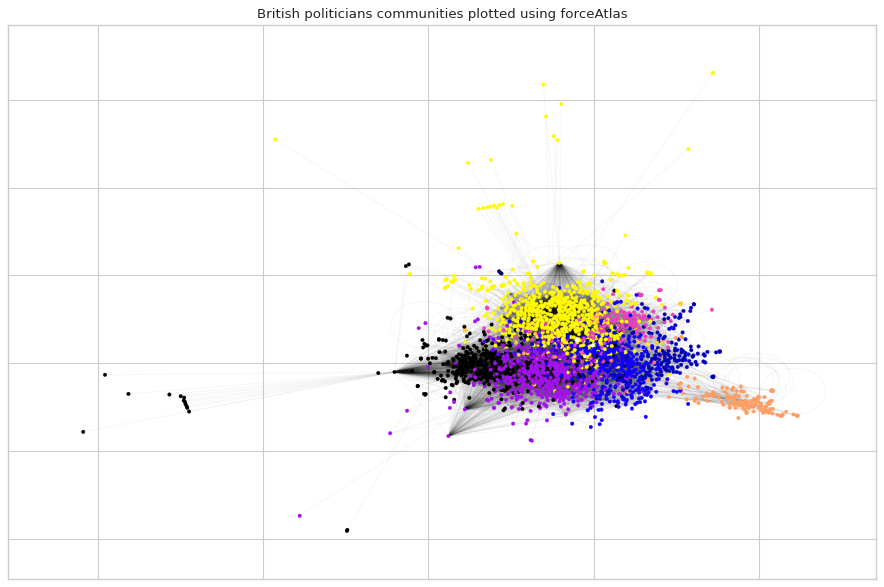

In [22]:
plt.figure(figsize=(14, 9), dpi=80)

# Tweeking of parameters. 
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=2.,
                        strongGravityMode=False,
                        gravity=1.0,

                        # Log
                        verbose=True)

# Color the nodes according to community
cmap = cm.get_cmap('gnuplot2', max(partition.values())+1)
positions = forceatlas2.forceatlas2_networkx_layout(undirected, pos=None, iterations=2000)
print(cmap)

# Plotting the nodes and edges
nx.draw_networkx_nodes(undirected, positions, partition.keys(), node_size=10,                  
                       cmap = cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(undirected, positions, alpha=0.03)
plt.title('British politicians communities plotted using forceAtlas')
plt.show()

### Word-clods and TF-IDF

In [23]:
# TF for each party
TF = {}
word_set = set()

for p in parties_dict:
    overall_freq = Counter()
    for i in parties_dict[p]:
        try:
            fd = nltk.FreqDist(text_dict[i])
            word_set.update(set(list(fd.keys())))
            overall_freq = overall_freq + Counter(fd)
        except:
            continue
    TF[p] = overall_freq


In [24]:
# TF analysis for all text
bigTF = Counter()
for c,i in TF.items():
    bigTF += i

In [25]:
# Now we create a function that calculates 
# the inverse document frequency for each word
# We divide the total number of communities by 
# the number of communities that contain that specific 
# word and then applies the logarithm to the whole term

def idf(word):
    occ = 0
    for i in TF:
        com = TF.get(i)
        if word in com.keys():
            occ += 1
    if occ == 0:
        occ = 1
    return np.log(10/occ)

In [26]:
# We define a TF-IDF function, which takes the key (community number)
# and the community and returns a dictionary with the TF_IDF scores 
# for each word in the community

def tf_idf(number, com):    
    vec = {}
    # Go through every word 
    for word in com.keys():

        # calculate the term frequency by dividing
        # the occurance of a certain word with the
        # total number of words in the commnity
        tf = TF[number][word]/len(TF[number])
        
        # calculates the inverse document frequency,
        idfreq = idf(word)

        # Then we multiply the two measures 
        val = tf*idfreq

        # save the result in a dictionary with the word
        # as the key and the TF-IDF score as the value
        vec[word] = val
    return vec

In [27]:
# Finally we calculate the TF-IDF vectors for each
# community and gather them in one vector

complete_vector = []
for i in TF:
    v = tf_idf(i, TF.get(i))
    complete_vector.append(v)

In [28]:
for i in range(len(complete_vector)):
    print(len(complete_vector[i]))

1454
4311
7334
2143
2582
20547
13173
1533
547
3514
2200
78060
48456
12424
17614
1889
1408


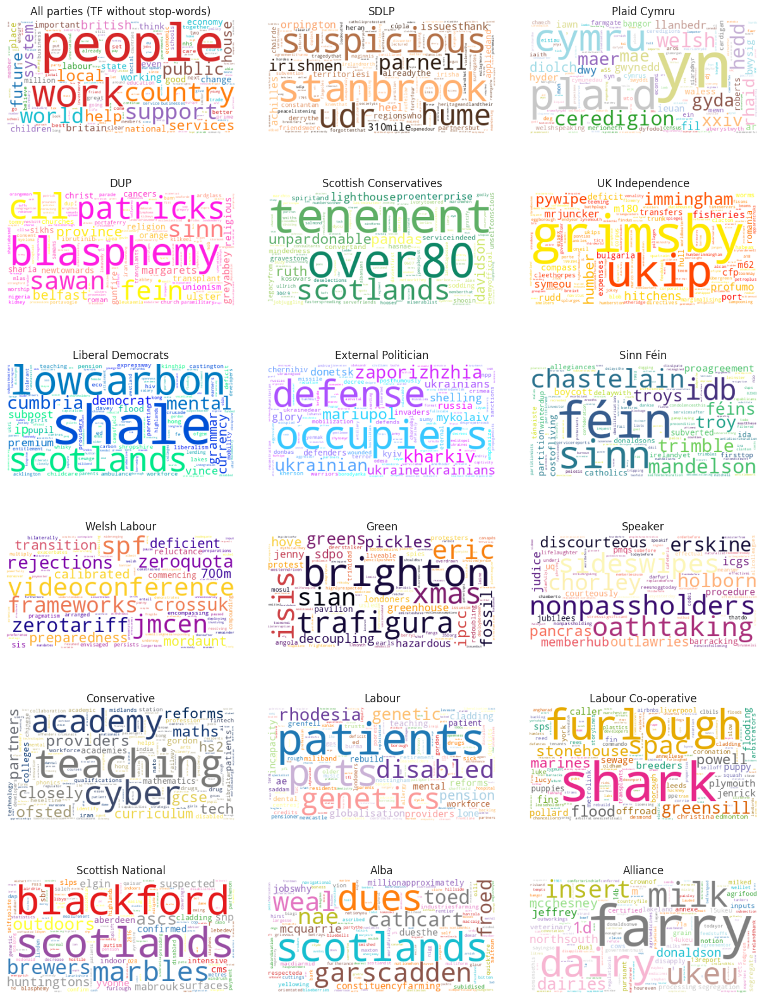

In [29]:
freq = bigTF.most_common(600)
sw = stopwords.words('english')
sw = sw + ['also', 'new', 'make', 'want', 'would', 'need', 'us', 
            'right', 'well', 'many', 'see', 'like', 'must', 'minister',
            'health', 'time', 'could', 'know', 'last', 'every', 'much',
            'way', 'made', 'first', 'get', 'across', 'part', 'say', 'back',
            'said', 'take',
            'year', 'government', 'today', 'uk', 'one', 'years', 'hon']
wordcloud = WordCloud(background_color="white",max_words=200, colormap= 'tab10')
wordcloud.generate_from_frequencies({a: b for a, b in freq if a not in sw})

# Define sub-plots
fig, axs = plt.subplots(6,3, figsize=(16, 20), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.001)
axs = axs.ravel()

cmap = [ 'copper', 'tab20', 'spring', 'summer', 
            'autumn', 'winter', 'cool', 'viridis', 'plasma',
             'inferno', 'magma', 'cividis','Paired', 
            'Dark2', 'Set1', 'tab10', 'tab20', 
            'tab20b','tab20c']

# Loop over each community in, generate a wordcloud based on the frequencies 
# using the 100 word with the highest TF-IDF scores
for i in range(len(complete_vector)+1):
    if i != 0:
        Cloud = WordCloud(background_color="white", max_words=200, colormap=cmap[i-1]).generate_from_frequencies(complete_vector[i-1]) #cmap_parties[list(parties_dict.keys())[i-1]])
        axs[i].imshow(Cloud, interpolation="bilinear")
        axs[i].set_title(list(parties_dict.keys())[i-1])
        axs[i].axis("off")
    else:
        axs[i].imshow(wordcloud, interpolation='bilinear')
        axs[i].set_title('All parties (TF without stop-words)')
        axs[i].axis("off")
plt.show()

## Sentiment Analysis

First, we generate the overall sentiment per node in the network.

In [42]:
# Retrieve the LabMt word list:
word_list = pd.read_csv('https://raw.githubusercontent.com/mathildetannebaek/SocialGraphsFinalProject/main/Data_Set_S1.txt', sep="\t").set_index('word')

In [43]:
""" 
    This function calculates the average happiness score for a tokenized text
"""
def sentiment_score_from_tokens(tokenized_text):

    # Initialize variables for the total score of the text 
    # and for the count of words not found in the wordlist
    total_happiness_score = 0
    unknown_word_count = 0

    for token in tokenized_text:
        # Increase the total_happiness_score if the word appears in the word_list
        # Otherwise increase the unknown_word_count by one
        try:
            if token != 'none':
                total_happiness_score += word_list["happiness_average"][token]
        except:
            unknown_word_count += 1
    
    # Throw exception if there was no words in the word_list
    if (len(tokenized_text)-unknown_word_count == 0):
        raise Exception("No words appear in the wordlist")

    # Calculate the average happiness score of words that appeared in the word_list
    avg_happiness_score = total_happiness_score/(len(tokenized_text)-unknown_word_count)

    return avg_happiness_score

In [ ]:
# Define stopwords
sw = stopwords.words('english')
sw = sw + ['also', 'new', 'make', 'want', 'would', 'need', 'us', 
            'right', 'well', 'many', 'see', 'like', 'must', 'minister',
            'health', 'time', 'could', 'know', 'last', 'every', 'much',
            'way', 'made', 'first', 'get', 'across', 'part', 'say', 'back',
            'said', 'take',
            'year', 'government', 'today', 'uk', 'one', 'years', 'hon']

# Calculate sentiment for speeches on all nodes
senti = {}
for name, node in network_with_speeches.nodes(data=True):
    try:
        speech = node['speech_text']
        speechWithoutStopwords = [t for t in speech.tokens if not t in sw]
        senti_score = sentiment_score_from_tokens(speechWithoutStopwords)
        senti[name] = senti_score
    except:
        continue

### Politician sentiment analysis:

In [ ]:
"""
    Plot the overall sentiment for all nodes
"""
plt.figure(figsize=(12, 6), dpi=1200)
plt.hist(senti.values(), bins=200,color='g')
plt.xlabel("Average happiness score", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.title("Histogram of sentiment values for all politicians", fontsize=16)
plt.vlines(x=sum(senti.values()) / len(senti), ymin=0, ymax = 50, color='k', linestyle='dashed', linewidth=1)

plt.vlines(x=np.percentile(list(senti.values()), 10), ymin=0, ymax = 44, linestyle = ":", color='k')
plt.vlines(x=np.percentile(list(senti.values()), 90), ymin=0, ymax = 44, linestyle = ":", color='k')

plt.text((np.percentile(list(senti.values()), 10))-.05, 45, "10th", size = 10, alpha = 0.8)
plt.text((sum(senti.values()) / len(senti))-.06, 51, "Mean", size = 11, alpha = 0.85)
plt.text((np.percentile(list(senti.values()), 90))-.05, 45, "90th", size = 10, alpha = 1)

plt.savefig('senti_plot.png')
plt.show();

In [ ]:
"""
    Function that prints mean, median, 10th and 90th percentile of a sentiment dictionary
"""
def sentiment_statistics(sentiment):
    # Calculate statistics
    sentiment_mean = statistics.mean(sentiment.values())
    sentiment_median = statistics.median(sentiment.values())
    sentiment_std = statistics.stdev(sentiment.values())
    sentiment_percentile_10 = np.percentile(list(sentiment.values()), 10)
    sentiment_percentile_90 = np.percentile(list(sentiment.values()), 90)

    print('Mean:           ',sentiment_mean)
    print('Median:         ',sentiment_median)
    print('Standard dev:   ',sentiment_std)
    print('10th percentile:',sentiment_percentile_10)
    print('90th percentile:',sentiment_percentile_90)

print('Sentiment statistics:')
sentiment_statistics(senti)

Sentiment statistics:
Mean:            5.629853355295123
Median:          5.6253825166981315
Standard dev:    0.16179780870917093
10th percentile: 5.45250742168877
90th percentile: 5.825668481367364


In [ ]:
counter = Counter(senti)

# 10 most happy
happiest_10 = counter.most_common(10)

# 10 most sad
saddest_10 = counter.most_common()[-10:]

#Print results
print("10 happiest politician speeches:")
print(*(c for c in happiest_10), sep='\n')

print("---------------------------------")

print("10 saddest politician speeches:")
print(*(c for c in saddest_10), sep='\n')

10 happiest politician speeches:
('Simon Baynes', 6.226335403726708)
('Justin Welby', 6.199375000000003)
('Louie French', 6.152125603864734)
('Paul Williams', 6.081176470588236)
('Ruth Kelly', 6.081089743589743)
('King Charles III', 6.054923291492319)
('James Wild', 6.051804123711341)
('Edwin Poots', 6.045)
('Nicholas Soames', 6.0432365145228175)
('Jason McCartney', 6.032727272727276)
---------------------------------
10 saddest politician speeches:
('Grahame Morris', 5.26141384388807)
('Joy Morrissey', 5.259043062200957)
('Andrew Bridgen', 5.251004016064258)
('Tahir Ali', 5.234075630252089)
('Richard Ottaway', 5.215017301038061)
('Ian Lucas', 5.153665048543688)
('Imran Ahmad Khan', 5.0385185185185195)
('Conor McGinn', 5.02138888888889)
('Chris Williamson', 4.9471428571428575)
('George Galloway', 3.7490909090909086)


In [ ]:
"""
    print the parties the 10 happiest and saddest speeches belong to
"""
print("Party distribution of 10 happiest politician speeches:")
for name,score in happiest_10:
    party = network_with_speeches.nodes[name]['partyAfterElection']
    print(party)

print("---------------------------------")
print("Party distribution of 10 saddest politician speeches:")
for name,score in saddest_10:
    party = network_with_speeches.nodes[name]['partyAfterElection']
    print(party)

Party distribution of 10 happiest politician speeches:
Conservative
External Politician
Conservative
Labour
Labour
External Politician
Conservative
DUP
Conservative
Conservative
---------------------------------
Party distribution of 10 saddest politician speeches:
Labour
Conservative
Conservative
Labour
Conservative
Labour
Conservative
Labour
Labour
Labour


### Party sentiment analysis:

In [35]:
# Make dict with all text from each party
parties_text_dict = {}
print('Word count for each party')
for party, members in parties_dict.items():
    party_tokens = []
    for pol in members:
        if pol in text_dict:
            party_tokens.extend(text_dict[pol].tokens)
    parties_text_dict[party] = nltk.Text(party_tokens)
    print(party, ' : ',len(parties_text_dict[party]))

Word count for each party
SDLP  :  5738
Plaid Cymru  :  23948
DUP  :  78873
Scottish Conservatives  :  9877
UK Independence  :  11624
Liberal Democrats  :  554302
External Politician  :  350880
Sinn Féin  :  6321
Welsh Labour  :  1726
Green  :  18544
Speaker  :  12453
Conservative  :  7579115
Labour  :  3185143
Labour Co-operative  :  189393
Scottish National  :  420101
Alba  :  10188
Alliance  :  6494


In [44]:
# Create stopwords
sw = stopwords.words('english')
sw = sw + ['also', 'new', 'make', 'want', 'would', 'need', 'us', 
            'right', 'well', 'many', 'see', 'like', 'must', 'minister',
            'health', 'time', 'could', 'know', 'last', 'every', 'much',
            'way', 'made', 'first', 'get', 'across', 'part', 'say', 'back',
            'said', 'take',
            'year', 'government', 'today', 'uk', 'one', 'years', 'hon']

# Get sentiment for each party
party_senti = {}
for party, speech in parties_text_dict.items():
    try:
        speechWithoutStopwords = [t for t in speech.tokens if not t in sw]
        senti_score = sentiment_score_from_tokens(speechWithoutStopwords)
        party_senti[party] = senti_score
    except:
        continue

In [45]:
# Get the happiest to saddest parties based on their speeches
counter = Counter(party_senti)

#Print results
print("Parties from happiest to saddest speeches:")
print(*(c for c in counter.most_common()), sep='\n')

Parties from happiest to saddest speeches:
('Scottish Conservatives', 5.704564258135719)
('DUP', 5.6795873120404625)
('Alba', 5.677065803667759)
('Conservative', 5.670062106073249)
('Speaker', 5.664052863436129)
('Liberal Democrats', 5.6524918312873424)
('Plaid Cymru', 5.6393779104477595)
('Alliance', 5.6241418380192725)
('Labour', 5.59367518854555)
('Scottish National', 5.588827532291388)
('SDLP', 5.587869700103392)
('External Politician', 5.57101222588823)
('Sinn Féin', 5.55742485783913)
('Labour Co-operative', 5.551270303065714)
('Green', 5.535534890869987)
('UK Independence', 5.5209099307159315)
('Welsh Labour', 5.469309838472826)


### Topic analysis (sentiment for buzz-words)

First, we define the synonym list for the three topics we wish to investigate: immigrants, climate and brexit.

In [46]:
# Themes we want to investigate
refugee_word_list = ["immigrant","immigrants","immigration",
    "migrant","migrants",
    "newcomer","newcomers",
    "foreigners","foreigner",
    "refugee","refugees"
    "fugitive","fugitives",
    "exile","exiled",
    "deportation",
    "emigrant","emigrants"]

brexit_word_list = ["brexit",
    "leaving the EU", "leaving the European Union", "leave EU", "leaving EU", "leave the European Union", "leave the EU", "british exit", "withdrawal from EU", "withdrawal from the European Union",
    "EU", "European Union", "Breturn","Brexiteer","Brexiter","Brexshit","Brextension"]

climate_word_list = ["environment","climate","nature","climate change", "global warming", "global heating","environmental"]

We modify the nltk concordance function to work with our word-lists:

In [ ]:
# Modify nltk concordance to take a list of words and return a nltk.text with the 300 char around each word 

def custom_concordance(text, word_list, width=79):
        """
        Prints a concordance for ``word`` with the specified context window.
        Word matching is not case-sensitive.

        :param word: The target word or phrase (a list of strings)
        :type word: str or list
        :param width: The width of each line, in characters (default=80)
        :type width: int
        :param lines: The number of lines to display (default=25)
        :type lines: int

        :seealso: ``ConcordanceIndex``
        """
        if "_concordance_index" not in text.__dict__:
            text._concordance_index = nltk.ConcordanceIndex(
                text.tokens, key=lambda s: s.lower()
            )
        result_list = []
        for word in word_list:
            concordance_lines = text._concordance_index.find_concordance(word, width)
            for line in concordance_lines:
                if line:
                    result_list.extend(word_tokenize(line.line))

        return nltk.Text(result_list)

Finally, we create the three dictionaries that use the party name as key, and then the values are the 300 character passages in their speeches where they mention on of the buzz-word topics:

In [ ]:
refugee_dict = {}
brexit_dict = {}
climate_dict = {}

for i in parties_text_dict:
    refugee_dict[i] = custom_concordance(parties_text_dict[i], refugee_word_list, width=300)

for i in parties_text_dict:
    brexit_dict[i] = custom_concordance(parties_text_dict[i], brexit_word_list, width=300)

for i in parties_text_dict:
    climate_dict[i] = custom_concordance(parties_text_dict[i], climate_word_list, width=300)

In [ ]:
# Define stopwords for all analyses
sw = stopwords.words('english')
sw = sw + ['also', 'new', 'make', 'want', 'would', 'need', 'us', 
            'right', 'well', 'many', 'see', 'like', 'must', 'minister',
            'health', 'time', 'could', 'know', 'last', 'every', 'much',
            'way', 'made', 'first', 'get', 'across', 'part', 'say', 'back',
            'said', 'take',
            'year', 'government', 'today', 'uk', 'one', 'years', 'hon']

### Immigrants:

In [ ]:
# Calculate sentiment for all parties with the text mentioning refugees
refugee_senti = {}
for party, speech_elements in refugee_dict.items():
    speechWithoutStopwords = [t for t in speech_elements.tokens if not t in sw]
    if len(speechWithoutStopwords) > 0:
        senti_score = sentiment_score_from_tokens(speechWithoutStopwords)
        refugee_senti[party] = senti_score

# Range parties from happiest to saddest 
counter = Counter(refugee_senti)

#Print results
print("Parties from happiest to saddest around the topic of immigrants:")
print(*(c for c in counter.most_common()), sep='\n')

print()

print("Parties that do not mention immigrants:")
allParties = set(refugee_dict.keys())
refugeeParties = set(refugee_senti.keys())
print(allParties ^ refugeeParties)

Parties from happiest to saddest around the topic of immigrants:
('DUP', 5.75830508474576)
('UK Independence', 5.538524590163939)
('Conservative', 5.528855783391949)
('External Politician', 5.508032407407403)
('Liberal Democrats', 5.467917477617758)
('Labour', 5.448816057707373)
('Scottish National', 5.421290322580634)
('Green', 5.307878787878788)

Parties that do not mention immigrants:
{'Sinn Féin', 'Labour Co-operative', 'SDLP', 'Alliance', 'Welsh Labour', 'Co-operative', 'Alba', 'Scottish Conservatives', 'Plaid Cymru'}


### Brexit:

In [ ]:
# Calculate sentiment for all parties with the text mentioning brexit
brexit_senti = {}
for party, speech_elements in brexit_dict.items():
    try:
        speechWithoutStopwords = [t for t in speech_elements.tokens if not t in sw]
        senti_score = sentiment_score_from_tokens(speechWithoutStopwords)
        brexit_senti[party] = senti_score
    except:
        continue

# Range parties from happiest to saddest 
counter = Counter(brexit_senti)

#Print results
print("Parties from happiest to saddest around the topic of brexit:")
print(*(c for c in counter.most_common()), sep='\n')

print()

print("Parties that do not mention brexit:")
allParties = set(brexit_dict.keys())
brexitParties = set(brexit_senti.keys())
print(allParties ^ brexitParties)

Parties from happiest to saddest around the topic of brexit:
('Alba', 5.908518518518519)
('Sinn Féin', 5.739743589743591)
('Scottish Conservatives', 5.634667673716012)
('Liberal Democrats', 5.62416606432967)
('DUP', 5.6207569386038685)
('Conservative', 5.620007097967733)
('External Politician', 5.618632972771306)
('Plaid Cymru', 5.598590308370049)
('Labour', 5.550425476240223)
('Labour Co-operative', 5.539300000000003)
('UK Independence', 5.538536458333349)
('Alliance', 5.534103448275875)
('Scottish National', 5.512661120673266)
('Welsh Labour', 5.45645348837209)
('SDLP', 5.281585365853659)
('Green', 5.262207792207792)

Parties that do not mention brexit:
{'Co-operative'}


### Climate:

In [ ]:
# Calculate sentiment for all parties with the text mentioning climate
climate_senti = {}
for party, speech_elements in climate_dict.items():
    try:
        speechWithoutStopwords = [t for t in speech_elements.tokens if not t in sw]
        senti_score = sentiment_score_from_tokens(speechWithoutStopwords)
        climate_senti[party] = senti_score
    except:
        print('Unable to get sentiment for',party)

# Range parties from happiest to saddest 
counter = Counter(climate_senti)

#Print results
print("Parties from happiest to saddest around the topic of climate:")
print(*(c for c in counter.most_common()), sep='\n')

print()

print("Parties that do not mention climate:")
allParties = set(climate_dict.keys())
climateParties = set(climate_senti.keys())
print(allParties ^ climateParties)

Parties from happiest to saddest around the topic of climate:
('Plaid Cymru', 5.971400000000001)
('Scottish Conservatives', 5.949210526315792)
('Alba', 5.876666666666667)
('Conservative', 5.720574048808184)
('Sinn Féin', 5.7165263157894755)
('UK Independence', 5.699402277039814)
('Welsh Labour', 5.676171003717467)
('Alliance', 5.6584536082474255)
('Liberal Democrats', 5.656401750147078)
('External Politician', 5.654256803907896)
('Co-operative', 5.64138211382114)
('DUP', 5.630656716417916)
('Labour', 5.608374067589301)
('Scottish National', 5.534943109987343)
('Green', 5.492826666666683)
('SDLP', 5.447356321839079)
('Labour Co-operative', 5.218)

Parties that do not mention climate:
set()


## Historical Analysis

First, we create a corpus from the speeches that is sorted in chronological order

In [ ]:
chronological_tokens = []
party_dict = nx.get_node_attributes(bigger_politicians_graph, 'partyAfterElection')
year_word_offsets = []
party_word_offsets = []
previous_year = 0
start_range_year = 0
previous_party = ''
start_range_party = 0
current_offset = 0
for i, pol in ukpol.sort_values('Year').iterrows():
    #Ignore speeches without year statistics
    if pol['Year'] == 0:
        continue
    if pol['Speaker'] in bigger_politicians_graph.nodes and isinstance(pol['Speech'], str):
        # If the year of a speech changes we register the total word range for the finished year
        if pol['Year'] != previous_year:
            year_word_offsets.append((previous_year, start_range_year, current_offset))
            start_range_year = current_offset
            previous_year = pol["Year"]
        if party_dict[pol['Speaker']] != previous_party:
            party_word_offsets.append((previous_party, start_range_party, current_offset))
            start_range_party = current_offset
            previous_party = party_dict[pol['Speaker']]
        no_punct = re.sub(r'[^\w\s]', '', pol['Speech'])
        no_punct = re.sub(r'\n', ' ', no_punct)
        no_punct = no_punct.lower()
        tokens = word_tokenize(no_punct)
        current_offset += len(tokens)
        chronological_tokens.extend(tokens)
else:
    # Adds the last year and removes the first entry, corresponding to the offset range for year 0 (will always be (0, 0))
    year_word_offsets.append((previous_year, start_range_year, current_offset))
    year_word_offsets = year_word_offsets[1:]
    party_word_offsets.append((previous_party, start_range_party, current_offset))
    party_word_offsets = party_word_offsets[1:]

chronological_corpus = nltk.Text(chronological_tokens)

Next, we define two functions for customizing the plot we wish to obtain in the historical analysis

In [ ]:
# Create the visualizer and draw the plot
def custom_compute_dispersion(self, X, y=None):
    print(self)
    for offset, word in enumerate(X):
        if self.ignore_case:
            word = word.lower()

        # NOTE: this will find all indices if duplicate words are supplied
        # In the case that word is not in target words, any empty list is
        # returned and no data will be yielded
        for y_coord in (self.indexed_words_ == word).nonzero()[0]:
            y_coord = int(y_coord)
            for category, startOffset, endOffset in self.category_offsets:
                if startOffset <= offset <= endOffset:
                    break;
            yield (offset, y_coord, category)

def custom_draw(self, points, **kwargs):

        # Resolve the labels with the classes
        labels = self.labels if self.labels is not None else self.classes_
        if len(labels) != len(self.classes_):
            raise YellowbrickValueError(
                (
                    "number of supplied labels ({}) does not "
                    "match the number of classes ({})"
                ).format(len(labels), len(self.classes_))
            )

        # Create the color mapping for the labels.
        if self.colormap:
            color_values = resolve_colors(
                n_colors=len(labels), colormap=self.colormap, colors=self.colors
            )
            colors = dict(zip(labels, color_values))
        else:
            colors = self.colors

        # Transform labels into a map of class to label
        labels = dict(zip(self.classes_, labels))

        # Define boundaries with a vertical line
        if self.annotate_docs:
            xticks = []
            xticklabels = []
            #xcoords = []
            for i, b in enumerate(self.boundaries_):
                if b[0] in [1843, 1975, 1990, 2000, 2005] or b[0] in range(2010, 2023):
                    xticklabels.append(b[0])
                    xticks.append(b[1])
                # Remove the axvline is no year lines are preferred. Move it inside the if statement above if lines should only be shown for years with their own xtick
                self.ax.axvline(x=b[1], color="lightgray", linestyle=":", linewidth=1, zorder=1)
            self.ax.set_xticks(xticks, minor=False)
            self.ax.set_xticklabels(xticklabels, fontdict=None, minor=False)
        series = defaultdict(lambda: {"x": [], "y": []})

        if self.word_categories_ is not None:
            for point, t in zip(points, self.word_categories_):
                label = labels[t]
                series[label]["x"].append(point[0])
                series[label]["y"].append(point[1])
        else:
            label = self.classes_[0]
            for x, y in points:
                series[label]["x"].append(x)
                series[label]["y"].append(y)
        for label, points in series.items():
            if label not in colors:
                print(label)
            self.ax.scatter(
            points["x"],
            points["y"],
            marker="|",
            c=[colors[label]],
            zorder=100,
            )

        self.ax.set_yticks(list(range(len(self.indexed_words_))))
        self.ax.set_yticklabels(self.indexed_words_, fontsize=20)
        self.ax.figure.set_figwidth(40)
        self.ax.figure.set_figheight(5)

        return self.ax

Now, we are ready for doing the dispersion plot. We wish to investigate the following target words:

In [ ]:
target_words = [
    "brexit",
    "pandemic",
    "draconian",
    "inflation",
    'ukraine',
    'rights',
    'independence',
]

In [ ]:
year_visualizer = DispersionPlot(target_words, labels=[year for (year, _, _) in year_word_offsets], colormap='prism', ignore_case=True, annotate_docs=True)
year_visualizer._compute_dispersion = custom_compute_dispersion.__get__(year_visualizer, DispersionPlot)
year_visualizer.draw = custom_draw.__get__(year_visualizer, DispersionPlot)
year_visualizer.category_offsets = year_word_offsets

year_visualizer.boundaries_ = year_word_offsets

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  exec(code_obj, self.user_global_ns, self.user_ns)
DispersionPlot(annotate_docs=True, ax=<AxesSubplot:>, colormap='prism',
               ignore_case=True,
               labels=[1843, 1846, 1847, 1868, 1901, 1913, 1917, 1918, 1919,
                       1921, 1922, 1928, 1931, 1939, 1940, 1941, 1943, 1944,
                       1945, 1950, 1953, 1960, 1965, 1966, 1967, 1968, 1969,
                       1970, 1971, 1974, ...],
               search_terms=['brexit', 'pandemic', 'draconian', 'inflation',
                             'ukraine', 'rights', 'independence'])
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ig

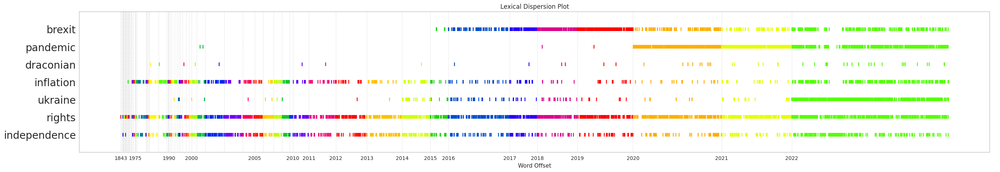

<AxesSubplot:title={'center':'Lexical Dispersion Plot'}, xlabel='Word Offset'>

In [ ]:
year_visualizer.fit(chronological_corpus.tokens, y=[year for (year, _, _) in year_word_offsets])
year_visualizer.show()

In [ ]:
party_visualizer = DispersionPlot(target_words, labels=np.unique([party for (party, _, _) in party_word_offsets]), colors=parties_and_corresponding_color, ignore_case=True, annotate_docs=True)
party_visualizer._compute_dispersion = custom_compute_dispersion.__get__(party_visualizer, DispersionPlot)
party_visualizer.draw = custom_draw.__get__(party_visualizer, DispersionPlot)
party_visualizer.category_offsets = party_word_offsets
party_visualizer.boundaries_ = year_word_offsets

DispersionPlot(annotate_docs=True, ax=<AxesSubplot:>,
               colors={'Alba': '#035EB8', 'Alliance': '#F6CB2E',
                       'Birkenhead Social Justice': '#B2393E',
                       'Change UK': '#222221', 'Co-operative': '#3F1D70',
                       'Conservative': '#0387DC', 'DUP': '#D46A4B',
                       'External Politician': '#000000', 'Green': '#6AB024',
                       'Independent': '#DCDCDC', 'Labour': '#E4023B',
                       'Labour Co-operative': '#E4023B',
                       'Liber...
               labels=array(['Alba', 'Alliance', 'Conservative', 'DUP', 'External Politician',
       'Green', 'Labour', 'Labour Co-operative', 'Liberal Democrats',
       'Plaid Cymru', 'SDLP', 'Scottish Conservatives',
       'Scottish National', 'Sinn Féin', 'Speaker', 'UK Independence',
       'Welsh Labour'], dtype='<U22'),
               search_terms=['brexit', 'pandemic', 'draconian', 'inflation',
                             'u

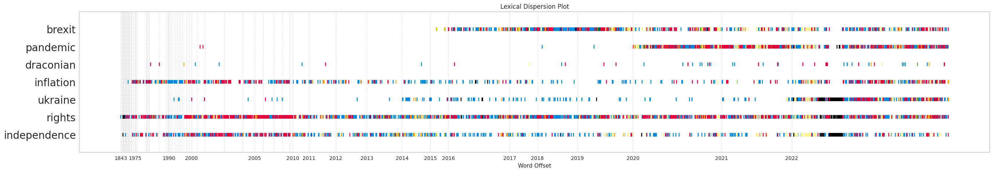

<AxesSubplot:title={'center':'Lexical Dispersion Plot'}, xlabel='Word Offset'>

In [ ]:
party_visualizer.fit(chronological_corpus.tokens, y=[cat for (cat, _, _) in party_word_offsets])
party_visualizer.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=5c9b915a-eb5e-4f9f-aa09-cd511b8bbb84' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>